### Reading data

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
filename = 'Data.csv'
data = pd.read_csv(filename)
pd.set_option('display.max_columns', None) # To show all columns
data.sample(1)

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
105257,105257,35,175,70,78.0,1.2,1.2,1,1,101,60,112,187,150,49,118,16.3,1,1.2,19,16,18,1,0


### Data cleaning & removing outliers

#### info

In [3]:
# understanding the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   159256 non-null  int64  
 1   age                  159256 non-null  int64  
 2   height(cm)           159256 non-null  int64  
 3   weight(kg)           159256 non-null  int64  
 4   waist(cm)            159256 non-null  float64
 5   eyesight(left)       159256 non-null  float64
 6   eyesight(right)      159256 non-null  float64
 7   hearing(left)        159256 non-null  int64  
 8   hearing(right)       159256 non-null  int64  
 9   systolic             159256 non-null  int64  
 10  relaxation           159256 non-null  int64  
 11  fasting blood sugar  159256 non-null  int64  
 12  Cholesterol          159256 non-null  int64  
 13  triglyceride         159256 non-null  int64  
 14  HDL                  159256 non-null  int64  
 15  LDL              

In [4]:
data.isna().sum()

id                     0
age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64

No nulls in data

In [5]:
# we can consider it as Univariate Analysis also
pd.set_option('display.max_columns', None)
data.describe()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000,159256.000000
mean,79627.500000,44.306626,165.266929,67.143662,83.001990,1.005798,1.000989,1.023974,1.023421,122.503648,76.874071,98.352552,195.796165,127.616046,55.852684,114.607682,14.796965,1.074233,0.892764,25.516853,26.550296,36.216004,0.197996,0.437365
std,45973.391572,11.842286,8.818970,12.586198,8.957937,0.402113,0.392299,0.152969,0.151238,12.729315,8.994642,15.329740,28.396959,66.188989,13.964141,28.158931,1.431213,0.347856,0.179346,9.464882,17.753070,31.204643,0.398490,0.496063
min,0.000000,20.000000,135.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,77.000000,44.000000,46.000000,77.000000,8.000000,9.000000,1.000000,4.900000,1.000000,0.100000,6.000000,1.000000,2.000000,0.000000,0.000000
25%,39813.750000,40.000000,160.000000,60.000000,77.000000,0.800000,0.800000,1.000000,1.000000,114.000000,70.000000,90.000000,175.000000,77.000000,45.000000,95.000000,13.800000,1.000000,0.800000,20.000000,16.000000,18.000000,0.000000,0.000000
50%,79627.500000,40.000000,165.000000,65.000000,83.000000,1.000000,1.000000,1.000000,1.000000,121.000000,78.000000,96.000000,196.000000,115.000000,54.000000,114.000000,15.000000,1.000000,0.900000,24.000000,22.000000,27.000000,0.000000,0.000000
75%,119441.250000,55.000000,170.000000,75.000000,89.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,103.000000,217.000000,165.000000,64.000000,133.000000,15.800000,1.000000,1.000000,29.000000,32.000000,44.000000,0.000000,1.000000
max,159255.000000,85.000000,190.000000,130.000000,127.000000,9.900000,9.900000,2.000000,2.000000,213.000000,133.000000,375.000000,393.000000,766.000000,136.000000,1860.000000,21.000000,6.000000,9.900000,778.000000,2914.000000,999.000000,1.000000,1.000000


## analysis

### Univariate Analysis

In [6]:
# convert smoking from Numerical to Categorical in a copy data
df = data.copy()
df['smoking'] = df['smoking'].map({0: 'Not Smoking', 1: 'Smoking'})

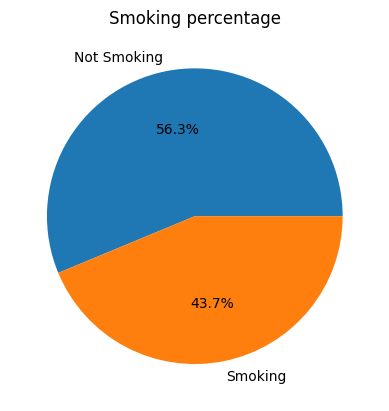

In [7]:
# Pie Chart for smoking
smoking_counts = data['smoking'].value_counts()
custom_labels = ['Not Smoking','Smoking']
# label_mapping = {0: 'Not Smoking', 1: 'Smoking'}
# custom_labels = [label_mapping[key] for key in smoking_counts.index]
plt.pie(smoking_counts, labels=custom_labels, autopct='%1.1f%%')
plt.title('Smoking percentage')
plt.show()

In [8]:
# ploty Pie Chart for smoking
smoking_counts = df['smoking'].value_counts()
fig = px.pie(values=smoking_counts, names=smoking_counts.index, title='Smoking Percentage',width=600,height=400)
fig.show()

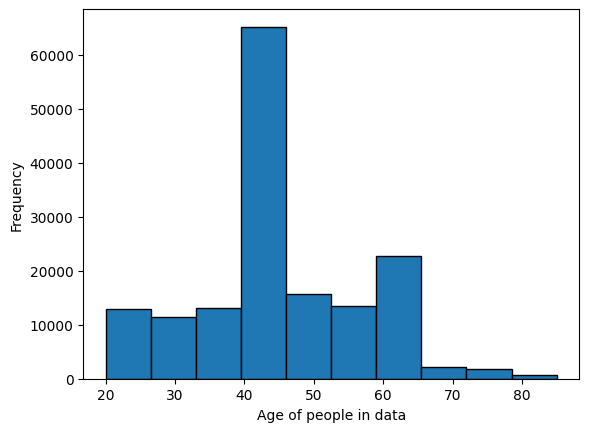

In [9]:
# Histogram for Ages
plt.hist(data['age'], bins=10,edgecolor='black') 
plt.xlabel('Age of people in data') 
plt.ylabel('Frequency') 
plt.show()

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\Local\Temp\ipykernel_23976\2675482304.py:13: UserWarning:

The figure layout has changed to tight

C:\Users\ahmed\AppData\L

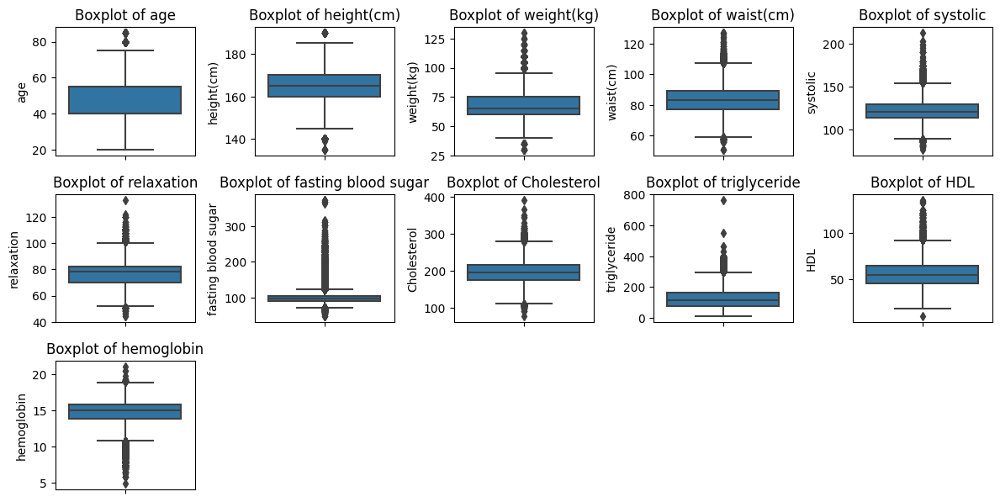

In [10]:
# box plot for columns
numerical_cols = [
    'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'systolic', 
    'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 
    'HDL','hemoglobin'
]

plt.figure(figsize=(12, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 5, i)  
    sns.boxplot(y=data[col])
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()


### Bivariate Analysis

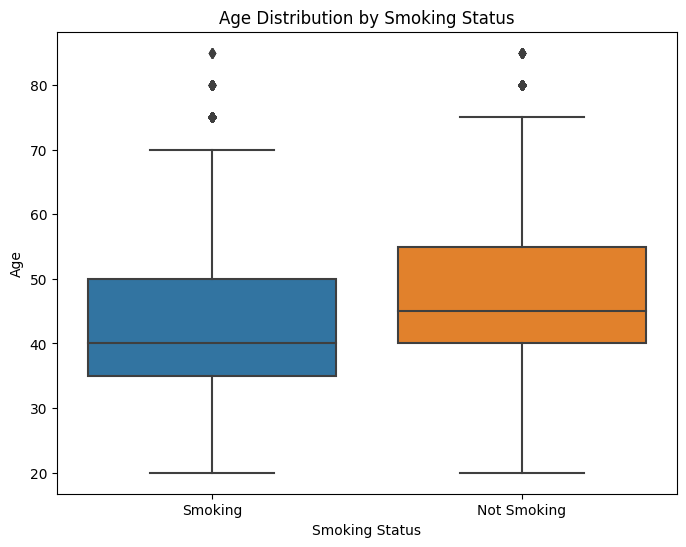

In [11]:
# Box plot for Age Distribution by Smoking Status
plt.figure(figsize=(8, 6))
sns.boxplot(x='smoking', y='age', data=df)  
# plt.xticks([0, 1], ['Not Smoking', 'Smoking']) 
plt.xlabel('Smoking Status')
plt.ylabel('Age')
plt.title('Age Distribution by Smoking Status')
plt.show()
# explore the patterns between Age & Smoking

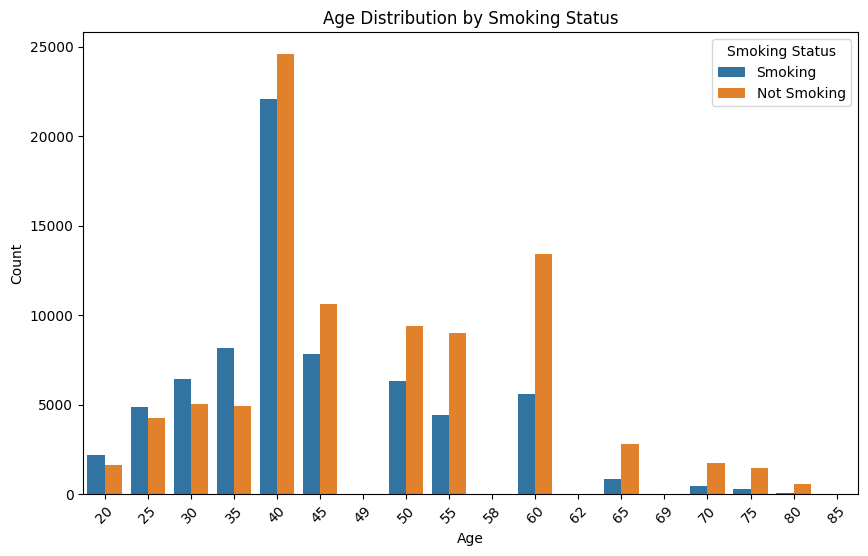

In [12]:
#  count plot for Age Distribution by Smoking Status
plt.figure(figsize=(10, 6)) 
sns.countplot(x='age', hue='smoking', data=df)
plt.xlabel('Age')
plt.ylabel('Count')  
plt.title('Age Distribution by Smoking Status') 
plt.xticks(rotation=45)  
plt.legend(title='Smoking Status') 
plt.show()


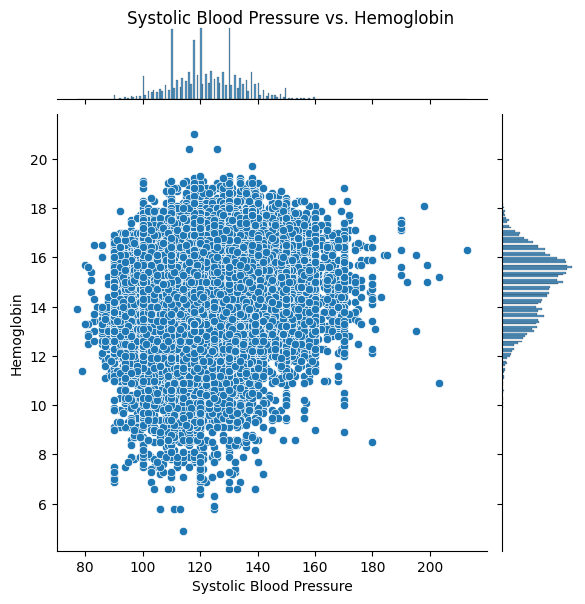

In [13]:
# Scatter plot for Systolic Blood Pressure vs. Hemoglobin
sns.jointplot(x='systolic', y='hemoglobin', data=data)
plt.xlabel('Systolic Blood Pressure') 
plt.ylabel('Hemoglobin') 
plt.suptitle('Systolic Blood Pressure vs. Hemoglobin', y=0.999)
plt.show()

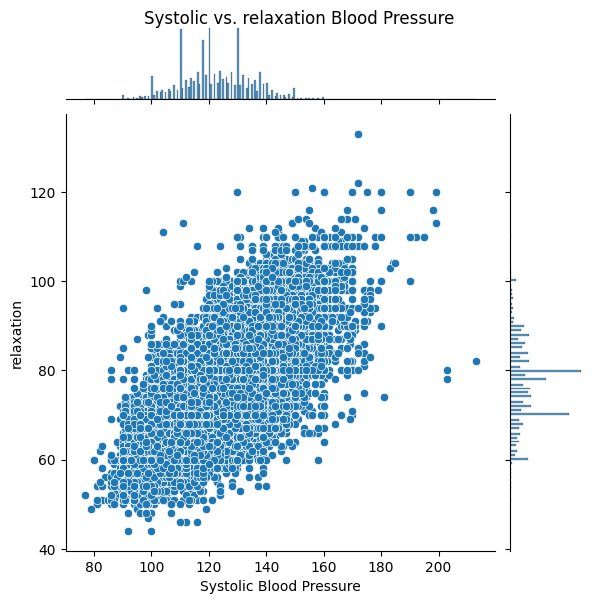

In [14]:
# Scatter plot for Systolic vs. relaxation Blood Pressure 
sns.jointplot(x='systolic', y='relaxation', data=data)
plt.xlabel('Systolic Blood Pressure') 
plt.ylabel('relaxation') 
plt.suptitle('Systolic vs. relaxation Blood Pressure', y=0.999)
plt.show()

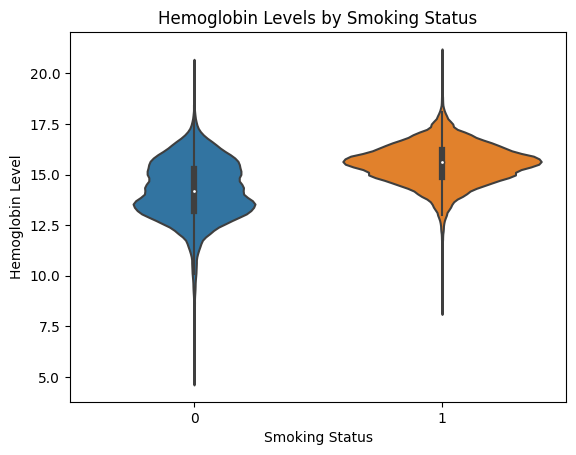

In [15]:
# violin plot for Hemoglobin Levels by Smoking Status
sns.violinplot(x='smoking', y='hemoglobin', data=data)
plt.xlabel('Smoking Status')
plt.ylabel('Hemoglobin Level')
plt.title('Hemoglobin Levels by Smoking Status')
plt.show()


In [16]:
# ploty violin plot for Hemoglobin Levels by Smoking Status

fig = px.violin(data, x='smoking', y='hemoglobin', color='smoking',
                title='Hemoglobin Levels by Smoking Status',
                width=600,height=400)

fig.show()


### Multivariate Analysis

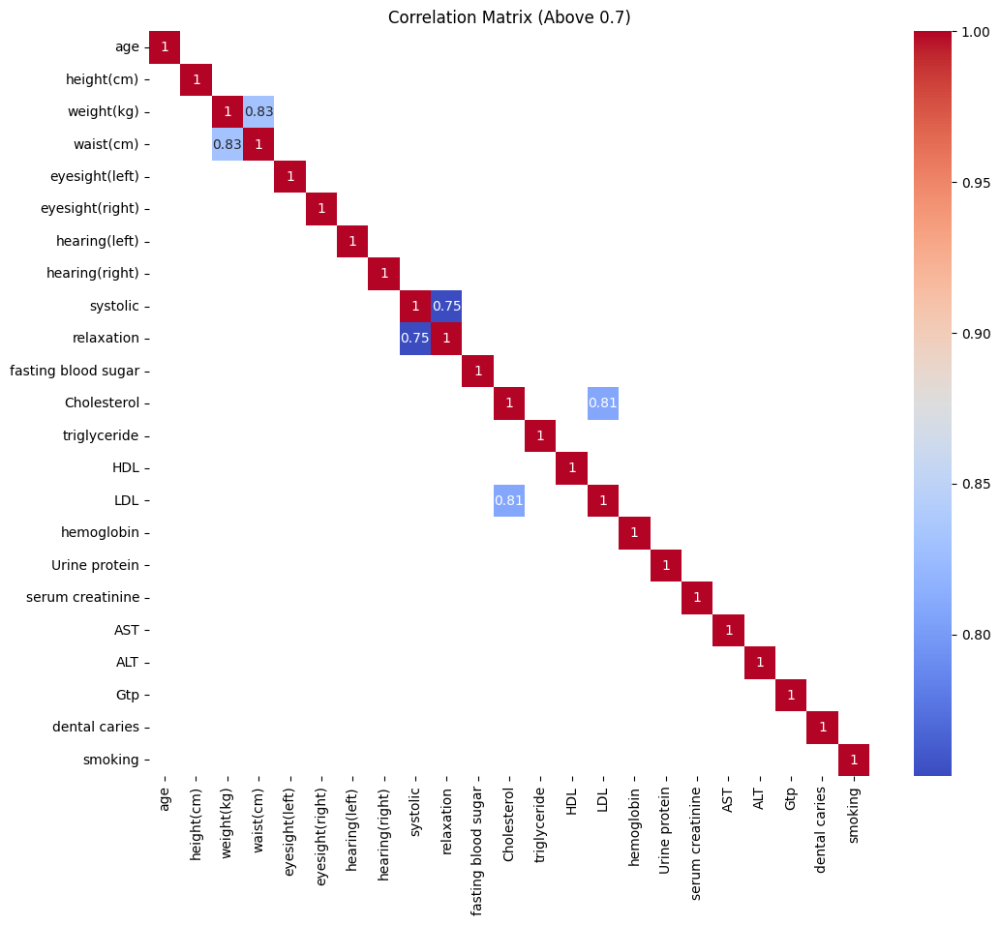

In [17]:
# correlation_matrix for Feature Engineering 
correlation_matrix = data.drop(['id'], axis=1).corr()
threshold = 0.7
strong_corr = correlation_matrix[correlation_matrix.abs() > threshold]
plt.figure(figsize=(12, 10))
sns.heatmap(strong_corr, annot=True, cmap='coolwarm')
plt.title(f'Correlation Matrix (Above {threshold})')
plt.show()


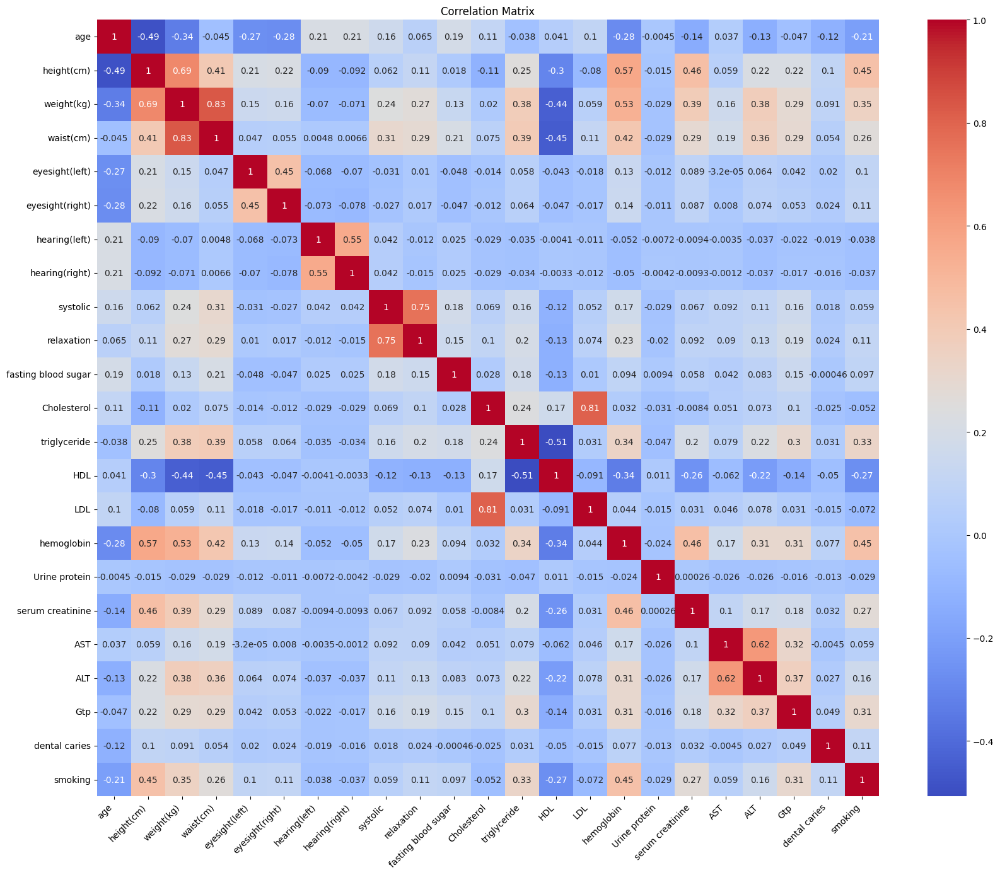

In [18]:
# correlation_matrix for all columns
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
plt.yticks(rotation=0)  # Rotate y-axis labels if needed
plt.title('Correlation Matrix')
plt.show()


In [19]:
# correlation_matrix for lower only with threshold
# plt.figure(figsize=(20, 16))
# strong_corr = correlation_matrix[correlation_matrix.abs() > .1]
# mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))  # Mask the upper triangle
# sns.heatmap(strong_corr, annot=True, cmap='coolwarm', mask=mask)
# plt.title('Correlation Matrix')
# plt.show()


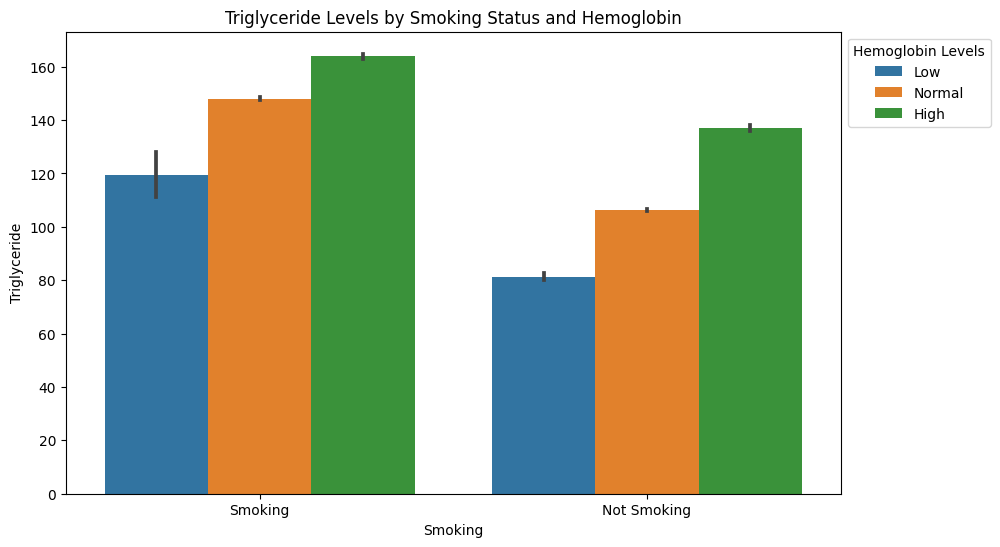

In [20]:
# bar plot for Triglyceride Levels by Smoking Status and Hemoglobin
df['hemoglobin_bins'] = pd.cut(df['hemoglobin'], bins=[0, 12, 16, 21], labels=['Low', 'Normal', 'High'])
plt.figure(figsize=(10, 6))
sns.barplot(x='smoking', y='triglyceride', hue='hemoglobin_bins', data=df)
plt.xlabel('Smoking')
plt.ylabel('Triglyceride')
plt.title('Triglyceride Levels by Smoking Status and Hemoglobin')
plt.legend(title='Hemoglobin Levels', bbox_to_anchor=(1, 1))  # Adjust legend position
plt.show()


In [21]:
# ploty scatter for HDL vs serum creatinine with smoking status
fig = px.scatter(df,width =900,height = 600, x='HDL', y='serum creatinine',
                 color='smoking',
                 trendline="ols")
fig.show()

You can also use feature selection techniques (e.g., Recursive Feature Elimination, Lasso regularization) to decide which feature to retain.